In [ ]:
#the town Hemu in Altay, which is meant to be the principal focus of development.

# get map and basic information of Hemu

In [ ]:
# Altay Airport, which is infamously small and in the middle of nowhere

# isochronehttp://localhost:8889/notebooks/Project%20Altay%20Week%201.ipynb#

In [ ]:
# Locations of important tourist attractions ([Aletai, China 2022: Best Places to Visit - Tripadvisor](https://www.tripadvisor.com/Tourism-g1152625-Aletai_Xinjiang_Uygur-Vacations.html)) to bundle with resorts, creating attractive tourist routes

# tripadvisor -> google map
# use google map to get travel time


In [ ]:
# Distance to nearby bodies of water for snowmakers, Iremu Lake

# OSM-natural

# look into scripts that distance between points

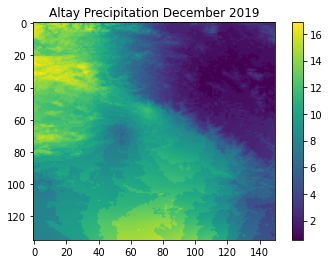

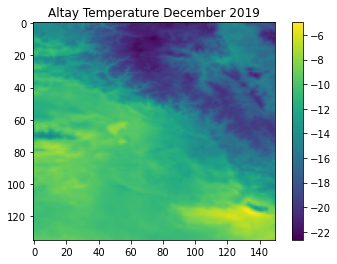

135 150


In [144]:
# High snowfall regions, like Kanas, where apparently snowed on Jul. 20th
# global weather site, maybe specifically Chinese - couldn't find available data
# alternatively, craete snowfall region from percipitation and temperature

# open and edit raster files using gdal

from osgeo import gdal
import numpy as np
import random

band_id = 1   # change to match the band number needed

def tif_to_array(address):

    prec = gdal.Open(address, gdal.GA_ReadOnly)

    GT_input = prec.GetGeoTransform()

    prec_band = prec.GetRasterBand(band_id)

    img_as_array = prec_band.ReadAsArray()

    size1,size2 = img_as_array.shape

    output=np.zeros(shape=(size1,size2))

    for i in range(0,size1):
        for j in range(0,size2):
            output[i,j] = img_as_array[i,j] 
    return output

p_data = tif_to_array('D:\Elson\Brighton\Application\Project Altay\Altay_prec_2019_12.tif') # change to own directory
t_data = tif_to_array('D:\Elson\Brighton\Application\Project Altay\Altay_tmax_2019_12.tif')
d_data = [31] # number of days in the months of the data

# ---------------show tif maps-----------------
from matplotlib import pyplot

p = pyplot.imshow(p_data)
pyplot.colorbar(p)
pyplot.title("Altay Precipitation December 2019")
pyplot.show()

t = pyplot.imshow(t_data)
pyplot.colorbar(t)
pyplot.title("Altay Temperature December 2019")
pyplot.show()

print(len(p_data),(len(p_data[0])))
   # do whatever transformation we would need here
   # export array data as .tif for moving back to qgis
    

import rasterio
from rasterio import Affine

def array_to_tif(in_array, address):
    dst_crs = "EPSG:4326" # Chinese crs code
    output = np.float32(in_array)

# GDAL = (c, a, b, f, d, e)
#affine.Affine(a, b, c,
#              d, e, f)

    GT_input_transform = Affine(0.041666666666666664, 0.0, 85.125,
                           0.0, -0.041666666666666664, 50.0)

    with rasterio.open(address,'w', driver='GTiff', height=output.shape[0], width=output.shape[1], count=1, 
                       dtype=np.float32, crs=dst_crs, transform=GT_input_transform,) as dest_file:
        dest_file.write(output, 1)
    dest_file.close()


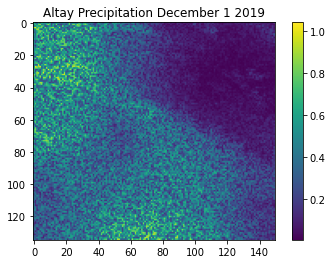

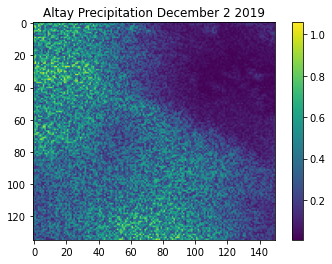

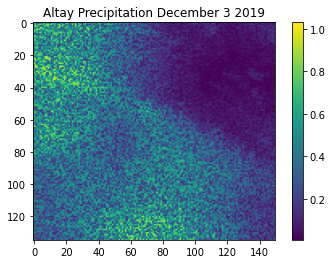

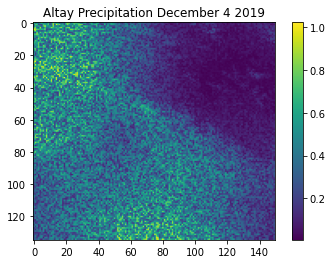

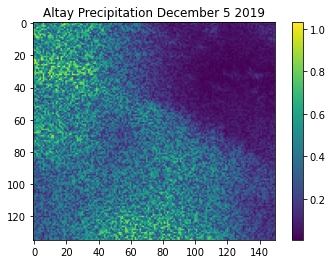

...

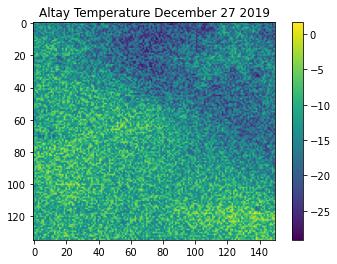

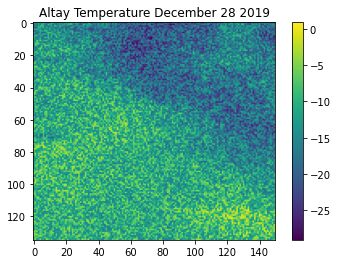

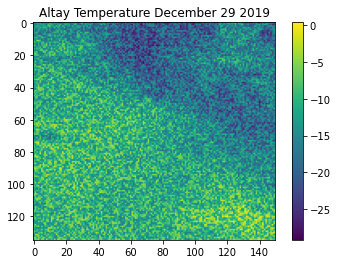

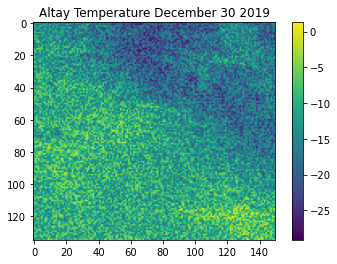

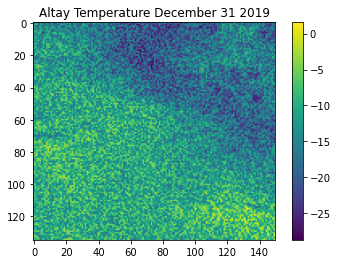

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [156]:
from matplotlib import pyplot

# creating Precip and temp data for each day from the average of the month: p_data -> Precip, t_data -> T_air
P_total = []
T_total = []
SWE_total = []
num_days = 31

# generate the image for for the first day in the month, then the second... end up with "num_days" many of images
#---------------------------Precipitation------------------------------

for i in range(0, num_days):
    Precip = []
    if(random.randint(0,100) < 40): # 40% chance of raining on that day
        for j in range(0, len(p_data)):
            Precip.append([])
            for k in range(0,len(p_data[j])):
                Precip[j].append(0)
    else:
        for j in range(0, len(p_data)):
            Precip.append([])
            for k in range(0,len(p_data[j])):
                Precip[j].append(p_data[j][k]/num_days * (1 + float(random.randint(-60, 100))/100.0))

    p = pyplot.imshow(Precip)
    pyplot.colorbar(p)
    pyplot.title("Altay Precipitation December " + str(i + 1) + " 2019")
    pyplot.show()    
    
    array_to_tif(Precip, 'Week 4\Precip\precipitation_day_' + str(i+1) + '.tif')

    P_total.append(Precip)
    
#------------------------Temperature_max-------------------------------
for i in range(0, num_days):
    T_air = []
    for j in range(0, len(t_data)):
        T_air.append([])
        for k in range(0,len(t_data[j])):
                T_air[j].append(t_data[j][k] + float(random.randint(-70, 71))/10.0)

    array_to_tif(T_air, 'temperature_day_' + str(i+1) + '.tif')
    # FIX! Won't work with the D: Project Altay path, 
    # maybe need to close the folder in function before proceeding
    # CPLE_OpenFailedError: Attempt to create new tiff file 'D:\Elson\Brighton\Application\Project Altay\Week 4\Precip_tif_data	emperature_day_1.tif' failed: No error
            
    t = pyplot.imshow(T_air)
    pyplot.colorbar(t)
    pyplot.title("Altay Temperature December " + str(i + 1) + " 2019")
    pyplot.show() 
    
    T_total.append(T_air)
#------------------------Snow_water_equivalent-------------------------        
for i in range(0, num_days):
    SWE = []
    for j in range(0, len(t_data)):
        SWE.append([])
        for k in range(0,len(t_data[j])):
            SWE[j].append(0)
    SWE_total.append(SWE)

    



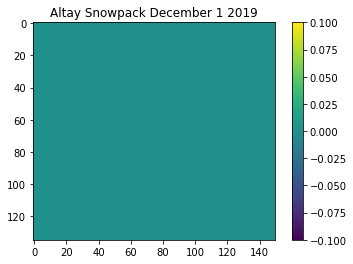

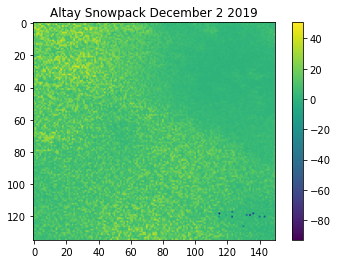

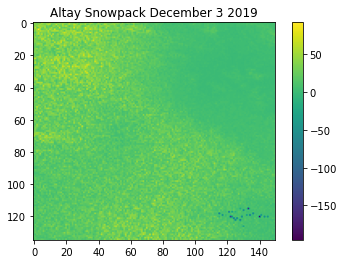

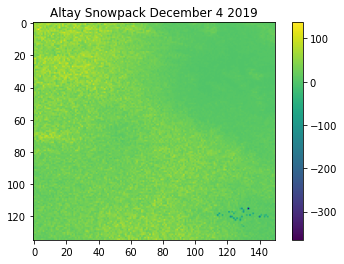

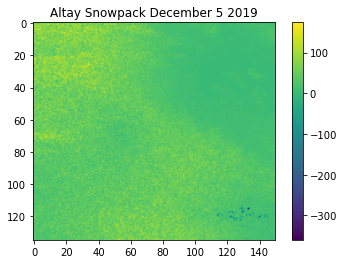

...

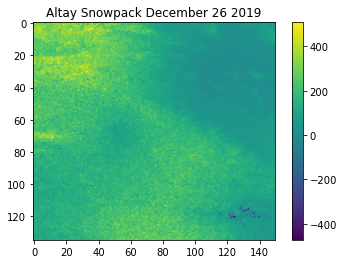

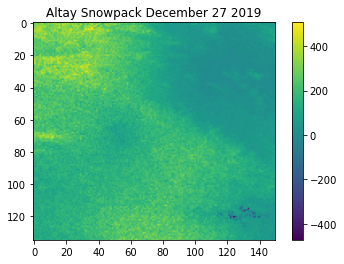

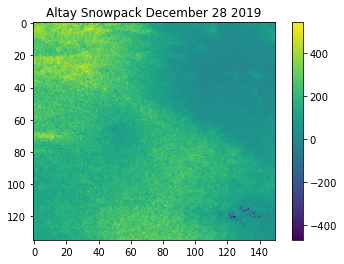

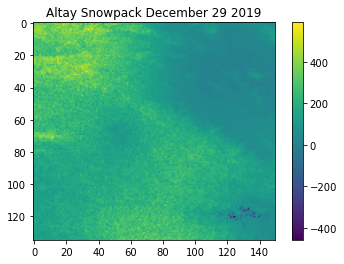

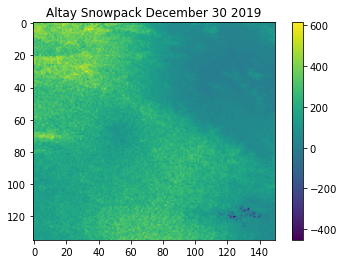

IndexError: list index out of range

In [167]:
# see: https://www.hec.usace.army.mil/confluence/hmsdocs/hmsguides/modeling-snowmelt/using-the-snowmelt-modeling-capabilities-within-hec-hms

import matplotlib.pyplot as plt

#calculate snowpack based on weather data

#T_air = [0, -2, -2, -5, 0, 0, -12, -14, -8, -7, -10, -2, -3, 0, 1, 5, 4, 2, 8, -1, -2, 4]
#Precip = [0, 2, 12, 6, 0, 0, 12, 14, 28, 27, 10, 2, 3, 0, 11, 5, 4, 12, 8, 1, 2, 4]
#SWE = [50, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

# dSWE = P - R + V + B, where:

# d = change in
# SWE = Snow Water Equivalent
# P = Precipitation contribution (see rain-to-snow multiplier table below)
# R = Run off (determined by phase change in the snowpack which is determined through the energy balance calculations)
# V = mass gained by water Vapor (can be negative)
# B = mass gained by Blowing snow (can be negative)

# The melt rate for dry conditions typically ranges from 1 to 4 mm/degC-day

rain_to_snow = [
   #Tmin, Tmax, multiplier 
    [1, 40, 0],
    [-2.8, 1, 10],
    [-6.7, -2.8, 15],
    [-9.5, -6.7, 20],
    [-12.2, -9.5, 30],
    [-17.8, -12.2, 40],
    [-28.9, -17.8, 50],
    [-60, -28.9, 100]]

for i in range(0, len(P_total)):
    P = P_total[i]
    for j in range(0, len(P_total[i])):
        for k in range(0, len(P_total[i][j])):  
            
            for r in range(0, len(rain_to_snow)):
                if (T_total[i][j][k] >= rain_to_snow[r][0]):
                    if (T_total[i][j][k] < rain_to_snow[r][1]):
                        P = P_total[i][j][k]*rain_to_snow[r][2]              
    
            R = 0
            if T_total[i][j][k] > 0:
                if P == 0:
                    R = T_total[i][j][k] * 0.15748
                else:
                    R = T_total[i][j][k] * 200 # tweekable data 
            else:
                R = 0.5
            SWE_total[i+1][j][k] = SWE_total[i][j][k] + P - R

#plot the stock's performance
    s = plt.imshow(SWE_total[i])
    plt.colorbar(s)
    plt.title("Altay Snowpack December " + str(i + 1) + " 2019")

    plt.show()

In [107]:
# Mountainous regions, Keketuo Hai

# countour lines

# categorize heights of mountains into groups using grid like last project


In [108]:
c = [["a"]]*3

a = []
for i in range (len(c)):
    for k in range (len(c[i])):
        a.append([])
        a[i].append('a')

        print(a)


[['a']]
[['a'], ['a']]
[['a'], ['a'], ['a']]


In [136]:
import os
print(os.path.abspath('.'))

C:\Users\Elson\Project Altay


IndexError: invalid index to scalar variable.